In [89]:
import pandas as pd
import numpy as np

# For multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor

#z-score
import seaborn as sns
from scipy.stats import zscore

#Display graphs
import matplotlib.pylab as plt
%matplotlib inline

#To remove imbalance in data
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler

# Splitting the data for training and testing out model
from sklearn.model_selection import train_test_split

#For Standardization
from sklearn.preprocessing import StandardScaler

## 1) Import and warehouse data

In [2]:
# A. Import given data sets
sensor = pd.read_csv("signal-data.csv")
sensor.dtypes

Time          object
0            float64
1            float64
2            float64
3            float64
              ...   
586          float64
587          float64
588          float64
589          float64
Pass/Fail      int64
Length: 592, dtype: object

In [3]:
sensor.head()

,Time,0,1,2,3,4,5,6,7,8,...,581,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1


In [4]:
sensor.shape

(1567, 592)

In [5]:
# B. 5 point summary

print("\n Minimum ")
minimum = sensor.min()
print(minimum)

print("\n First Quartile")
print(sensor.quantile(0.25))

print("\n  Median")
print(sensor.quantile(0.50))

print("\n Third Quartile")
print(sensor.quantile(0.75))

print("\n Maximum ")
maximum = sensor.max()
print(maximum)


 Minimum 
Time         2008-01-08 02:02:00
0                        2743.24
1                        2158.75
2                        2060.66
3                            0.0
                    ...         
586                      -0.0169
587                       0.0032
588                        0.001
589                          0.0
Pass/Fail                     -1
Length: 592, dtype: object

 First Quartile
0            2966.260000
1            2452.247500
2            2181.044400
3            1081.875800
4               1.017700
                ...     
586             0.013425
587             0.010600
588             0.003300
589            44.368600
Pass/Fail      -1.000000
Name: 0.25, Length: 591, dtype: float64

  Median
0            3011.4900
1            2499.4050
2            2201.0667
3            1285.2144
4               1.3168
               ...    
586             0.0205
587             0.0148
588             0.0046
589            71.9005
Pass/Fail      -1.0000
Name

## 2) Data Cleansing

In [6]:
# A. for loop which will remove all the features with 20%+ Null values and impute rest with mean of the feature.

sensor=sensor.replace(0,np.nan)

In [7]:
sensor.head()

,Time,0,1,2,3,4,5,6,7,8,...,581,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1


In [8]:
sensor['13']

0      NaN
1      NaN
2      NaN
3      NaN
4      NaN
        ..
1562   NaN
1563   NaN
1564   NaN
1565   NaN
1566   NaN
Name: 13, Length: 1567, dtype: float64

In [9]:
number_of_null=sensor. isnull(). sum()
print(number_of_null)

Time          0
0             6
1             7
2            14
3            15
             ..
586           1
587           1
588           1
589          33
Pass/Fail     0
Length: 592, dtype: int64


In [10]:
#Replace null values with median
#sensor = sensor.apply(lambda x: x.fillna(x.median()),axis=0)

# Number of rows
rows = len(sensor.axes[0])
print("\n Number of rows:",rows)

# 20% of total rows
percent20 = 0.20*len(sensor)
round(percent20)
percent20 = int(percent20)
print("\n 20% of rows:",percent20)

print("\n If any feature has more than 20% of null rows then drop that feature")
print("\n")

columns=len(sensor.columns)
print(columns)
print("\n")

sensor_drop = []

for i in range(columns):
    if(number_of_null[i]>percent20):
        print(i)
        sensor_drop.append(i)

        
print("\n Features to drop")
print(sensor_drop)
        
sensor.drop(sensor.columns[sensor_drop], axis=1, inplace=True)


print("\n Replace less than 20% blank values with median")
sensor=sensor.replace(0,sensor.median())
sensor=sensor.replace('NaN',sensor.median())


 Number of rows: 1567

 20% of rows: 313

 If any feature has more than 20% of null rows then drop that feature


592


14
53
73
74
75
86
95
96
98
102
110
111
112
113
115
142
150
158
159
179
180
187
190
191
192
193
194
195
207
210
221
227
230
231
232
233
234
235
236
237
238
241
242
243
244
245
246
247
248
250
257
258
259
260
261
262
263
264
265
266
267
277
285
293
294
314
315
316
323
326
327
328
329
330
331
343
346
347
348
359
365
370
371
372
373
374
375
376
379
380
381
382
383
384
385
386
388
395
396
397
398
399
400
401
402
403
404
405
415
419
420
423
450
451
452
459
462
463
464
465
466
467
479
482
483
487
488
493
499
500
501
502
503
504
505
506
507
508
509
510
512
513
514
515
516
517
518
519
520
522
529
530
531
532
533
534
535
536
537
538
539
579
580
581
582

 Features to drop
[14, 53, 73, 74, 75, 86, 95, 96, 98, 102, 110, 111, 112, 113, 115, 142, 150, 158, 159, 179, 180, 187, 190, 191, 192, 193, 194, 195, 207, 210, 221, 227, 230, 231, 232, 233, 234, 235, 236, 237, 238, 241, 242, 24

In [11]:
sensor.head()

,Time,0,1,2,3,4,5,6,7,8,...,577,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,14.9509,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,10.9003,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,9.2721,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,8.5831,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,10.9698,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1


In [12]:
#Identify and drop the features which are having same value for all the rows.
nunique = sensor.nunique()
cols_to_drop = nunique[nunique == 1].index
sensor.drop(cols_to_drop, axis=1,inplace=True)

In [13]:
sensor.head()

,Time,0,1,2,3,4,6,7,8,9,...,577,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,97.6133,0.1242,1.5005,0.0162,...,14.9509,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,0.1247,1.4966,-0.0005,...,10.9003,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,95.4878,0.1241,1.4436,0.0041,...,9.2721,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,104.2367,0.1217,1.4882,-0.0124,...,8.5831,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.3967,0.1235,1.5031,-0.0031,...,10.9698,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1


In [14]:
sensor=sensor.fillna(0)
sensor.head()

,Time,0,1,2,3,4,6,7,8,9,...,577,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,97.6133,0.1242,1.5005,0.0162,...,14.9509,0.5005,0.0118,0.0035,2.3630,0.0000,0.0000,0.0000,0.0000,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,0.1247,1.4966,-0.0005,...,10.9003,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,95.4878,0.1241,1.4436,0.0041,...,9.2721,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,104.2367,0.1217,1.4882,-0.0124,...,8.5831,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.3967,0.1235,1.5031,-0.0031,...,10.9698,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1


#### C. As column names are not specified, applying functional or logical knowledge to drop other features is not possible

In [15]:
# D. Check for Multicolinearity and E. Relevant modifications

# Drop irrelevant features
X_multi = sensor.drop(['Time'], axis=1)

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X_multi.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X_multi.values, i)
                          for i in range(len(X_multi.columns))]

print(vif_data)

       feature           VIF
0            0    358.371876
1            1    301.404771
2            2   3529.299695
3            3    121.551909
4            4  41540.451335
..         ...           ...
417        586      9.560536
418        587    129.298372
419        588    123.719262
420        589      5.888744
421  Pass/Fail      6.545356

[422 rows x 2 columns]


In [16]:
vif_data.head(50)

,feature,VIF
0,0,3.583719e+02
1,1,3.014048e+02
2,2,3.529300e+03
3,3,1.215519e+02
4,4,4.154045e+04
5,6,2.196525e+03
6,7,8.055528e+02
7,8,2.954232e+03
8,9,1.700487e+00
9,10,1.607287e+00


In [17]:
#Drop the features having more than 10 VIF
vif_filtered = vif_data[vif_data['VIF']<10]

In [18]:
vif_filtered

,feature,VIF
8,9,1.700487
9,10,1.607287
22,24,1.542692
39,41,5.134951
54,59,8.035551
66,75,2.157107
67,76,5.166656
68,77,2.061319
69,78,4.064408
70,79,2.664829


Now we have the list of the features which will be used for furthur analysis.

In [19]:
#Get all rows for the selected features
arr=list(vif_filtered['feature'])
arr
type(arr)

list

In [20]:
sensor_examine=pd.DataFrame()
i=0
j=0
for i in range(len(arr)):
    if(i<=j):
        for j in range(len(X_multi.columns)):
            pos=X_multi.columns[j]
            if(pos==arr[i]):
                sensor_examine[i]=X_multi.iloc[:, j]

sensor_examine=sensor_examine.rename({28:'Pass/Fail'},axis=1)
print(sensor_examine)

           0       1        2      3        4       5       6       7       8  \
0     0.0162 -0.0034   751.00  4.515  -1.7264  0.0126 -0.0206  0.0141 -0.0307   
1    -0.0005 -0.0148 -1640.25  2.773   0.8073 -0.0039 -0.0198  0.0004 -0.0440   
2     0.0041  0.0013 -1916.50  5.434  23.8245 -0.0078 -0.0326 -0.0052  0.0213   
3    -0.0124 -0.0033 -1657.25  1.279  24.3791 -0.0555 -0.0461 -0.0400  0.0400   
4    -0.0031 -0.0072   117.00  2.209 -12.2945 -0.0534  0.0183 -0.0167 -0.0449   
...      ...     ...      ...    ...      ...     ...     ...     ...     ...   
1562 -0.0045 -0.0057   356.00  1.427   2.8182  0.0000  0.0000  0.0000  0.0000   
1563 -0.0061 -0.0093   339.00  2.945  -3.3555  0.0000  0.0000  0.0000  0.0000   
1564  0.0000  0.0000 -1226.00  2.863   1.1664  0.0000  0.0000  0.0000  0.0000   
1565 -0.0072  0.0032   394.75  2.067   4.4682  0.0000  0.0000  0.0000  0.0000   
1566  0.0000  0.0000  -425.00  2.741   1.8718  0.0000  0.0000  0.0000  0.0000   

           9  ...        19

We are able to reduce the number of features to 29 from 592.
Analyzing 29 features and using them to build the model will help us in getting better results

## 3) Data analysis & visualisation

In [21]:
# A. Perform detailed univariate and bivariate analysis
add_later=sensor_examine['Pass/Fail']
sensor_examine=sensor_examine.drop(['Pass/Fail'],axis=1)


In [22]:
sensor_examine_scaled=sensor_examine.apply(zscore)
sensor_examine_scaled=sensor_examine_scaled.join(add_later)
sensor_examine_scaled.head()

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,Pass/Fail
0,1.128343,-0.381523,0.361808,0.510332,-0.491426,0.876522,0.251711,0.675690,-0.363362,-0.511179,...,-0.692371,0.383531,0.456406,1.326854,-0.090939,-1.159050,-1.171968,-1.734706,-1.061159,-1
1,0.022511,-1.608226,-0.462781,-0.222386,-0.224999,0.130923,0.275855,0.235586,-0.643253,-1.712119,...,-0.024239,1.040989,0.224751,-0.994956,0.737442,-0.602090,-1.171968,-0.958144,1.156951,-1
2,0.327111,0.124224,-0.558042,0.896880,2.195341,-0.045309,-0.110449,0.055690,0.730951,-0.384535,...,-0.423970,-0.874904,-0.267542,-0.994956,-0.035012,-0.612647,-0.077957,2.989383,-0.178407,1
3,-0.765478,-0.370762,-0.468643,-0.850790,2.253659,-2.200767,-0.517879,-1.062238,1.124482,2.803414,...,-0.106313,-0.862251,-0.533240,0.440043,-0.501403,-1.368352,0.300708,-0.100689,-0.274469,-1
4,-0.149655,-0.790424,0.143182,-0.459614,-1.602699,-2.105872,1.425714,-0.313741,-0.662193,-0.000234,...,-0.909497,-0.772878,0.380740,1.172734,0.193032,1.580163,-1.171968,-0.100689,-0.274469,-1


array([[<AxesSubplot:title={'center':'0'}, xlabel='[Pass/Fail]'>,
        <AxesSubplot:title={'center':'1'}, xlabel='[Pass/Fail]'>,
        <AxesSubplot:title={'center':'2'}, xlabel='[Pass/Fail]'>,
        <AxesSubplot:title={'center':'3'}, xlabel='[Pass/Fail]'>,
        <AxesSubplot:title={'center':'4'}, xlabel='[Pass/Fail]'>,
        <AxesSubplot:title={'center':'5'}, xlabel='[Pass/Fail]'>,
        <AxesSubplot:title={'center':'6'}, xlabel='[Pass/Fail]'>,
        <AxesSubplot:title={'center':'7'}, xlabel='[Pass/Fail]'>,
        <AxesSubplot:title={'center':'8'}, xlabel='[Pass/Fail]'>,
        <AxesSubplot:title={'center':'9'}, xlabel='[Pass/Fail]'>],
       [<AxesSubplot:title={'center':'10'}, xlabel='[Pass/Fail]'>,
        <AxesSubplot:title={'center':'11'}, xlabel='[Pass/Fail]'>,
        <AxesSubplot:title={'center':'12'}, xlabel='[Pass/Fail]'>,
        <AxesSubplot:title={'center':'13'}, xlabel='[Pass/Fail]'>,
        <AxesSubplot:title={'center':'14'}, xlabel='[Pass/Fail]'>,
    

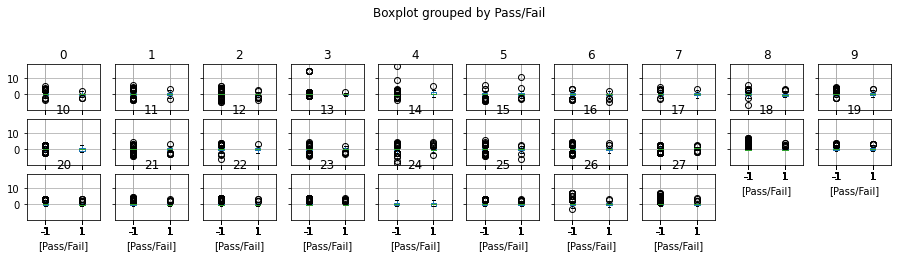

In [23]:

sensor_examine_scaled.boxplot(by='Pass/Fail', layout = (10,10),figsize=(15,10))

In [24]:
sensor_examine_scaled[0].groupby(sensor_examine_scaled['Pass/Fail']).count()

Pass/Fail
-1    1463
 1     104
Name: 0, dtype: int64

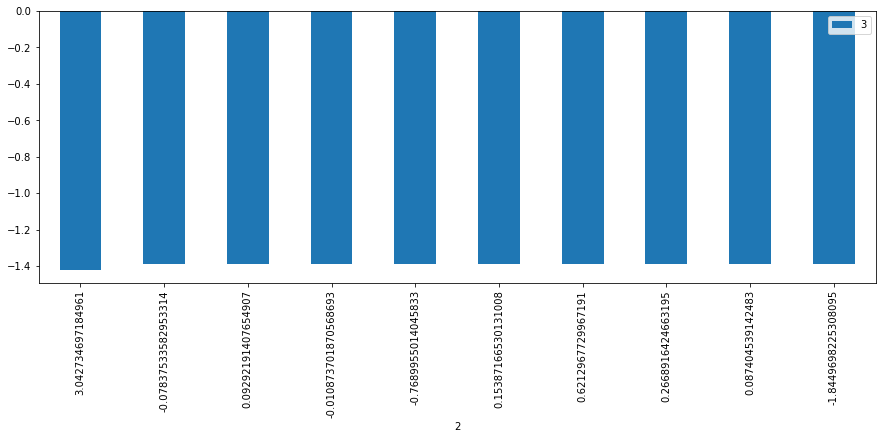

In [25]:
sensor_examine_scaled.groupby(by=[2])[3].sum().reset_index().sort_values([3],
                    ascending=True).head(10).plot(x=2,y=3,kind='bar', figsize=(15,5))

plt.show()

C:\Users\Dhanashri\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='6', ylabel='10'>

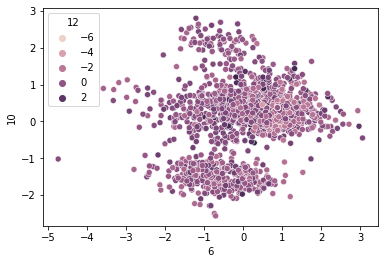

In [26]:
#Scatterplot
sns.scatterplot(sensor_examine_scaled[6],sensor_examine_scaled[10],hue=sensor_examine_scaled[12])

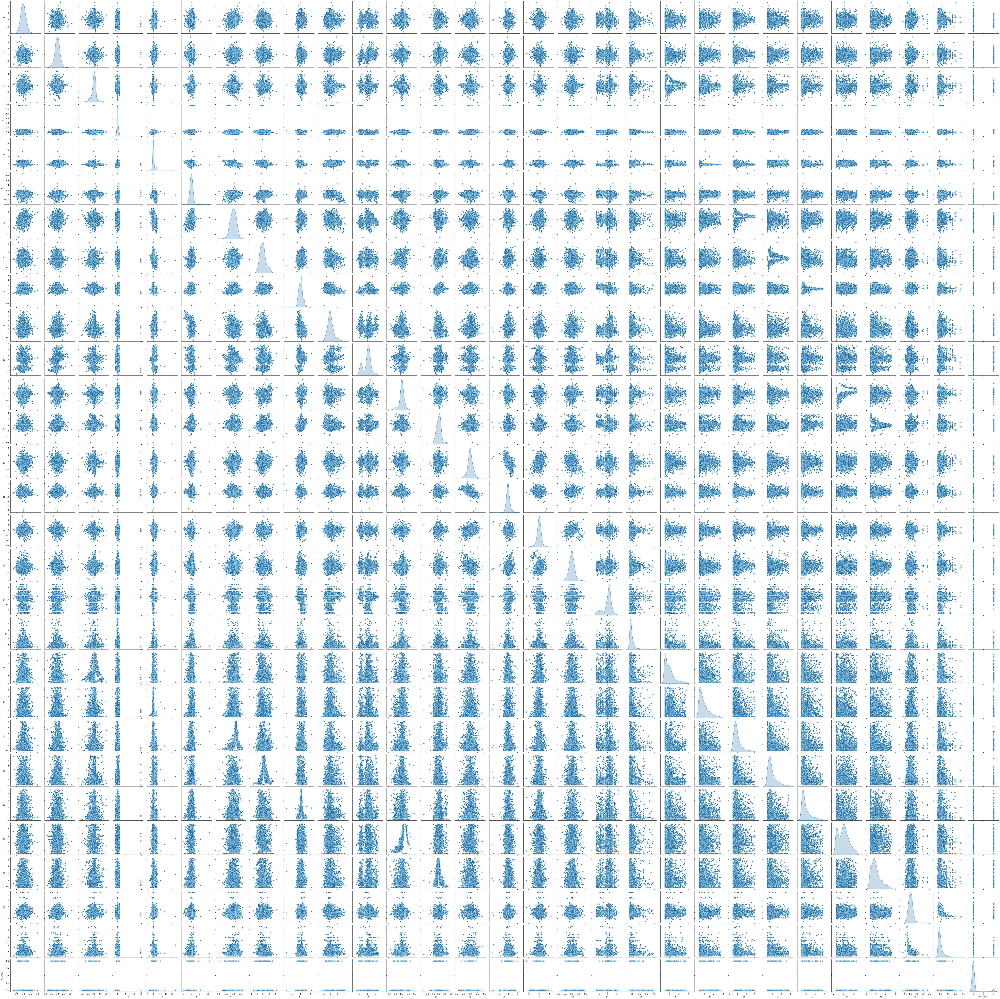

In [27]:
#Pairplot
sns.pairplot(sensor_examine_scaled,diag_kind='kde')

In [28]:
# Measure of dispersion 

#Mean of all attributes
print("\n Mean :\n",sensor_examine_scaled.mean())

#Median
print("\n Median :\n",sensor_examine_scaled.median())

#IQR
print("\n IQR: \n",sensor_examine_scaled.quantile(0.75)-sensor_examine_scaled.quantile(0.25))

#Data Dispersion
print("\n Data Dispersion: \n",sensor_examine_scaled.var())


 Mean :
 0            4.209389e-17
1           -8.190065e-17
2           -1.737159e-17
3            5.134870e-17
4            1.995851e-16
5           -4.293524e-17
6            1.214373e-16
7            3.671813e-16
8           -7.617108e-16
9           -1.420547e-17
10          -4.562754e-17
11           1.280972e-16
12           1.463766e-16
13           2.196357e-17
14           6.943322e-18
15          -2.309717e-17
16           4.669030e-17
17          -3.179404e-16
18          -3.315791e-17
19           3.696256e-16
20           1.853442e-16
21           4.534414e-17
22           1.642308e-16
23          -3.117410e-17
24           5.951419e-18
25           1.241296e-16
26           3.391600e-16
27           8.218626e-17
Pass/Fail   -8.672623e-01
dtype: float64

 Median :
 0           -0.030463
1            0.027379
2            0.077318
3           -0.097462
4           -0.214294
5            0.045067
6            0.016307
7           -0.079233
8            0.038588
9          

In [29]:
#Correlation and covariance

print("Covariance of each attribute against every other attribute\n",sensor_examine_scaled.cov())
print("\n Correlation coefficient between every pair of attribute:\n",sensor_examine_scaled.corr())

Covariance of each attribute against every other attribute
                   0         1         2         3         4         5  \
0          1.000639 -0.064107  0.014306 -0.035143 -0.027254  0.050138   
1         -0.064107  1.000639 -0.014906 -0.027602  0.084956 -0.027723   
2          0.014306 -0.014906  1.000639 -0.004059  0.036822  0.052962   
3         -0.035143 -0.027602 -0.004059  1.000639  0.002554  0.026874   
4         -0.027254  0.084956  0.036822  0.002554  1.000639 -0.219229   
5          0.050138 -0.027723  0.052962  0.026874 -0.219229  1.000639   
6          0.237718  0.074376 -0.025891 -0.101271 -0.256920  0.142974   
7         -0.019593  0.011400  0.022093 -0.012255 -0.033103  0.082010   
8          0.054856 -0.031095 -0.095555 -0.086667 -0.279736  0.151952   
9         -0.003637  0.097056  0.015225  0.035897  0.349382 -0.295340   
10        -0.010477  0.220915 -0.066429 -0.116892 -0.116479 -0.064432   
11         0.009607  0.003318 -0.033290  0.021368  0.002791  0.0

<AxesSubplot:>

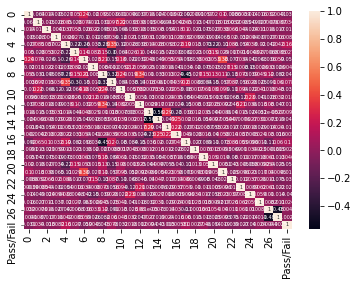

In [30]:
#Heatmap
sns.heatmap(sensor_examine_scaled.corr(),annot=True, annot_kws={'size': 5})

Looking at the heatmap, it is clear that the features has very less correlation between them

## 4) Data pre-processing

In [62]:
# A. Segregate predictors vs target attributes.

#Independent variables
X=sensor_examine_scaled.drop(['Pass/Fail'],axis=1)
#dependent variable
Y=sensor_examine_scaled['Pass/Fail']

In [63]:
# B. Check for target balancing and fix it if found imbalanced.
sensor_examine_scaled.groupby(['Pass/Fail']).count()


,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
Pass/Fail,,,,,,,,,,,,,,,,,,,,,
-1,1463,1463,1463,1463,1463,1463,1463,1463,1463,1463,...,1463,1463,1463,1463,1463,1463,1463,1463,1463,1463
1,104,104,104,104,104,104,104,104,104,104,...,104,104,104,104,104,104,104,104,104,104


Looking at the data, it is clear that the data for both the classes are imbalance.

C:\Users\Dhanashri\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


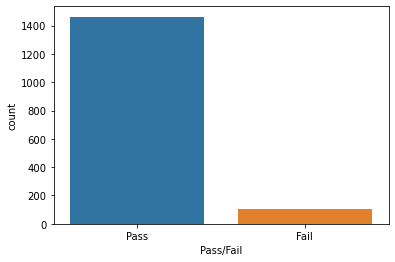

In [64]:
# visualize the target variable
g = sns.countplot(sensor_examine_scaled['Pass/Fail'])
g.set_xticklabels(['Pass','Fail'])
plt.show()

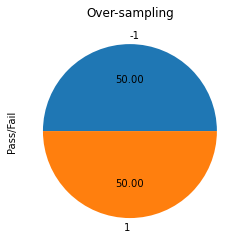

In [68]:
ros=RandomOverSampler(sampling_strategy=1)
x_res,y_res=ros.fit_resample(X,Y)
ax=y_res.value_counts().plot.pie(autopct='%.2f')
_=ax.set_title('Over-sampling')

In [69]:
y_res.value_counts()

-1    1463
 1    1463
Name: Pass/Fail, dtype: int64

C:\Users\Dhanashri\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Dhanashri\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Dhanashri\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Dhanashri\

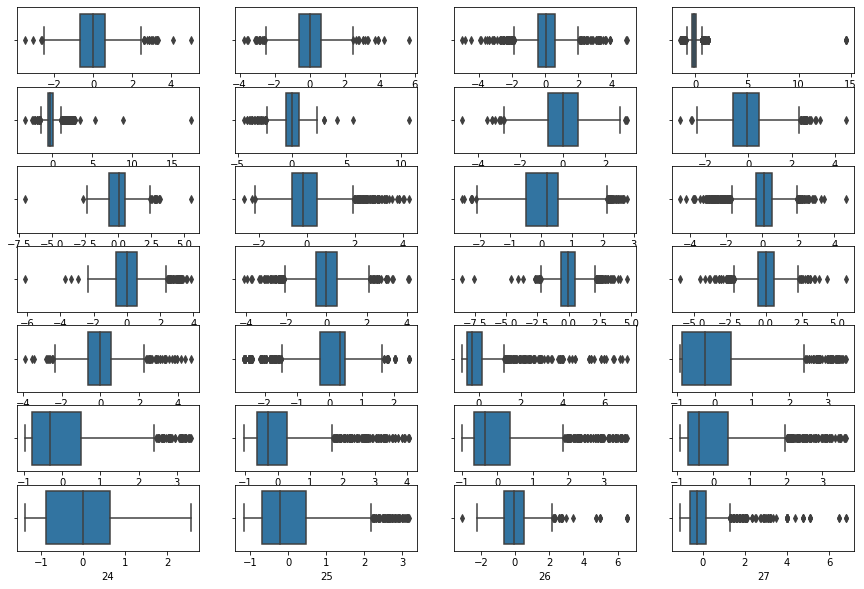

In [88]:
plt.figure(figsize=(15,10))
pos = 1
for i in sensor_examine_scaled.drop(columns = 'Pass/Fail').columns:
    plt.subplot(7, 4, pos)
    sns.boxplot(sensor_examine_scaled[i])
    pos += 1 

This is how data looks like before test train split. Also we can observe the outliers as well.

In [113]:
# C. Perform train-test split

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.25, stratify = Y, random_state=1)

In [114]:
type(X_train)

pandas.core.frame.DataFrame

C:\Users\Dhanashri\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Dhanashri\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Dhanashri\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Dhanashri\

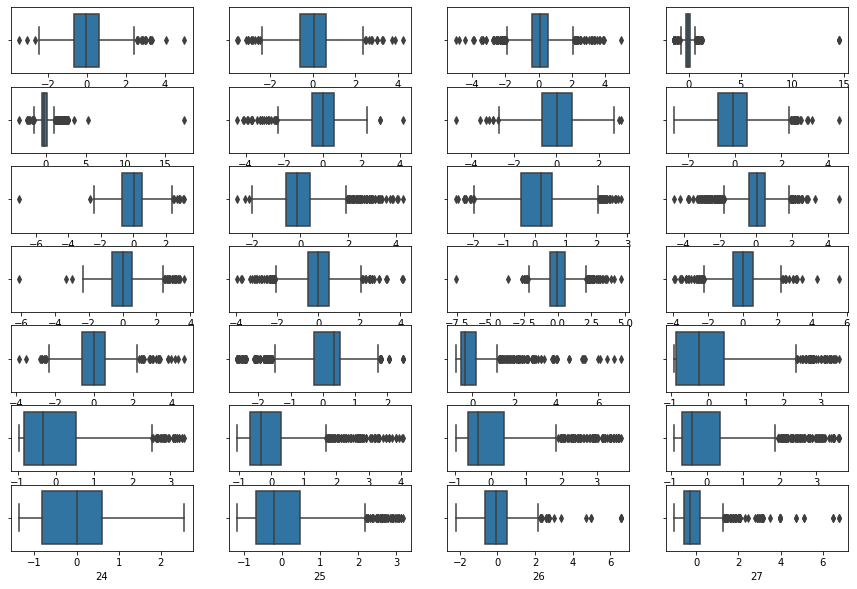

In [99]:
plt.figure(figsize=(15,10))
pos = 1
for i in X_train.columns:
    plt.subplot(7, 4, pos)
    sns.boxplot(X_train[i])
    pos += 1 

# 5) Model training, testing and tuning

Looking at the graphs it is clear that the train and test data have similar statistical characteristics when compared with original data.

In [109]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression(solver='liblinear', random_state=0)

logreg.fit(X_train, y_train)

LogisticRegression(random_state=0, solver='liblinear')

In [110]:
from sklearn.metrics import confusion_matrix

pred = logreg.predict(X_test)
tn, fp, fn, tp = confusion_matrix(y_test,pred).ravel()

lr_score = logreg.score(X_test, y_test)
lr_recall = round(tp/(tp+fn), 3)   # Of all the people with Chd, how many were recognised to have Chd
lr_precision = round(tp/(tp+fp), 3)  # Of all the people predicted to have Chd, how many did have Chd
lr_specificity =round(tn/(tn+fp),3)    # Of all the people without Chds, how many were recognised to not have Chd

result = pd.DataFrame({'Model' : ['Logistic Regression'], 'Accuracy' : [lr_score], 'Precision' : [lr_precision],
                      'True positive rate' : [lr_recall], 'True negative rate' : [lr_specificity],
                       'False positive rate' :  [1-lr_specificity]})
result

,Model,Accuracy,Precision,True positive rate,True negative rate,False positive rate
0,Logistic Regression,0.931122,0.0,0.0,0.997,0.003


The above numbers clearly shows the imbalance in data

In [126]:
# Therefore Now do  test train split of over sampled data

In [143]:

X_train, X_test, y_train, y_test = train_test_split(x_res,y_res, test_size=0.25, stratify = y_res, random_state=1)

In [144]:
# Create a table of all essential parameter for all the models for comparision

#Logistic Regression
logreg = LogisticRegression(solver='liblinear', random_state=0)

logreg.fit(X_train, y_train)

pred = logreg.predict(X_test)
tn, fp, fn, tp = confusion_matrix(y_test,pred).ravel()

lr_score = logreg.score(X_test, y_test)
lr_recall = round(tp/(tp+fn), 3)   # Of all the people with Chd, how many were recognised to have Chd
lr_precision = round(tp/(tp+fp), 3)  # Of all the people predicted to have Chd, how many did have Chd
lr_specificity =round(tn/(tn+fp),3)    # Of all the people without Chds, how many were recognised to not have Chd

result = pd.DataFrame({'Model' : ['Logistic Regression'], 'Accuracy' : [lr_score], 'Precision' : [lr_precision],
                      'True positive rate' : [lr_recall], 'True negative rate' : [lr_specificity],
                       'False positive rate' :  [1-lr_specificity]})
result

,Model,Accuracy,Precision,True positive rate,True negative rate,False positive rate
0,Logistic Regression,0.710383,0.692,0.76,0.661,0.339


In [145]:
#Decision Tree
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(random_state=1)

dt.fit(X_train, y_train)

pred = dt.predict(X_test)

tn, fp, fn, tp = confusion_matrix(y_test, pred).ravel()

dt_score = dt.score(X_test, y_test)
dt_recall = round(tp/(tp+fn), 3)   # Of all the people with Chd, how many were recognised to have Chd
dt_precision = round(tp/(tp+fp), 3)  # Of all the people predicted to have Chd, how many did have Chd
dt_specificity =round(tn/(tn+fp),3)    # Of all the people without Chds, how many were recognised to not have Chd

result.loc[1] = ['Decision Tree', dt_score, dt_precision, dt_recall, dt_specificity, 1-dt_specificity]
result

,Model,Accuracy,Precision,True positive rate,True negative rate,False positive rate
0,Logistic Regression,0.710383,0.692,0.76,0.661,0.339
1,Decision Tree,0.950820,0.910,1.00,0.902,0.098


In [146]:
#Change the maximum depth to 4

dt = DecisionTreeClassifier(max_depth= 4, random_state=1)

dt.fit(X_train, y_train)

pred = dt.predict(X_test)

tn, fp, fn, tp = confusion_matrix(y_test, pred).ravel()

dt_score = dt.score(X_test, y_test)
dt_recall = round(tp/(tp+fn), 3)   # Of all the people with Chd, how many were recognised to have Chd
dt_precision = round(tp/(tp+fp), 3)  # Of all the people predicted to have Chd, how many did have Chd
dt_specificity =round(tn/(tn+fp),3)    # Of all the people without Chds, how many were recognised to not have Chd

result.loc[2] = ['Decision Tree with depth 4', dt_score, dt_precision, dt_recall, dt_specificity, 1-dt_specificity]
result

,Model,Accuracy,Precision,True positive rate,True negative rate,False positive rate
0,Logistic Regression,0.710383,0.692,0.760,0.661,0.339
1,Decision Tree,0.950820,0.910,1.000,0.902,0.098
2,Decision Tree with depth 4,0.767760,0.718,0.883,0.653,0.347


By changing the depth to 4 we can see a significant drop in all parameters except false positive rate.

In [147]:
# Random Forest
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=1)

rf.fit(X_train, y_train)

pred = rf.predict(X_test)

tn, fp, fn, tp = confusion_matrix(y_test, pred).ravel()

rf_score = rf.score(X_test, y_test)
rf_recall = round(tp/(tp+fn), 3)   # Of all the people with Chd, how many were recognised to have Chd
rf_precision = round(tp/(tp+fp), 3)  # Of all the people predicted to have Chd, how many did have Chd
rf_specificity =round(tn/(tn+fp),3) 

result.loc[3] = ['Random Forest', rf_score, rf_precision, rf_recall, rf_specificity, 1 - rf_specificity]
result

,Model,Accuracy,Precision,True positive rate,True negative rate,False positive rate
0,Logistic Regression,0.710383,0.692,0.760,0.661,0.339
1,Decision Tree,0.950820,0.910,1.000,0.902,0.098
2,Decision Tree with depth 4,0.767760,0.718,0.883,0.653,0.347
3,Random Forest,0.995902,0.992,1.000,0.992,0.008


In [153]:
#Random Forest tuned
forest = RandomForestClassifier( bootstrap = False,
  max_depth = 20,
  max_features =  'auto' ,
  min_samples_leaf = 1,
  min_samples_split = 2,
  n_estimators = 200, random_state= 1)

forest.fit(X_train, y_train)

pred = forest.predict(X_test)

tn, fp, fn, tp = confusion_matrix(y_test, pred).ravel()

forest_score = forest.score(X_test, y_test)
forest_recall = round(tp/(tp+fn), 3)   # Of all the people with Chd, how many were recognised to have Chd
forest_precision = round(tp/(tp+fp), 3)  # Of all the people predicted to have Chd, how many did have Chd
forest_specificity =round(tn/(tn+fp),3) 

result.loc[4] = ['Random forest(tuned)', forest_score, forest_precision, forest_recall, forest_specificity, 1 - forest_specificity]
result

,Model,Accuracy,Precision,True positive rate,True negative rate,False positive rate
0,Logistic Regression,0.710383,0.692,0.760,0.661,0.339
1,Decision Tree,0.950820,0.910,1.000,0.902,0.098
2,Decision Tree with depth 4,0.767760,0.718,0.883,0.653,0.347
3,Random Forest,0.995902,0.992,1.000,0.992,0.008
4,Random forest(tuned),0.993169,0.987,1.000,0.986,0.014
5,SVM,1.000000,1.000,1.000,1.000,0.000
6,SVM_scaled_data,0.806011,0.776,0.861,0.751,0.249
7,knn,0.948087,0.906,1.000,0.896,0.104


In [149]:
# SVM

from sklearn.svm import SVC

svm = SVC(C=1, gamma=1, kernel='rbf')

svm.fit(X_train, y_train)

pred = svm.predict(X_test)

tn, fp, fn, tp = confusion_matrix(y_test, pred).ravel()

svm_score = svm.score(X_test, y_test)
svm_recall = round(tp/(tp+fn), 3)   # Of all the people with Chd, how many were recognised to have Chd
svm_precision = round(tp/(tp+fp), 3)  # Of all the people predicted to have Chd, how many did have Chd
svm_specificity =round(tn/(tn+fp),3) 

result.loc[5] = ['SVM', svm_score, svm_precision, svm_recall, svm_specificity, 1 - svm_specificity]
result

,Model,Accuracy,Precision,True positive rate,True negative rate,False positive rate
0,Logistic Regression,0.710383,0.692,0.760,0.661,0.339
1,Decision Tree,0.950820,0.910,1.000,0.902,0.098
2,Decision Tree with depth 4,0.767760,0.718,0.883,0.653,0.347
3,Random Forest,0.995902,0.992,1.000,0.992,0.008
4,Random forest(tuned),0.993169,0.987,1.000,0.986,0.014
5,SVM,1.000000,1.000,1.000,1.000,0.000


In [150]:
#SVM on scaled data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled = scaler.fit(X_train)
scaled_train = scaler.transform(X_train)

scaled_test = scaler.transform(X_test)

svm = SVC(C=1, gamma= 0.01, kernel='rbf')

svm.fit(scaled_train, y_train)


pred = svm.predict(scaled_test)

tn, fp, fn, tp = confusion_matrix(y_test, pred).ravel()

svm_score = svm.score(scaled_test, y_test)
svm_recall = round(tp/(tp+fn), 3)   # Of all the people with Chd, how many were recognised to have Chd
svm_precision = round(tp/(tp+fp), 3)  # Of all the people predicted to have Chd, how many did have Chd
svm_specificity =round(tn/(tn+fp),3) 

result.loc[6] = ['SVM_scaled_data', svm_score, svm_precision, svm_recall, svm_specificity, 1 - svm_specificity]
result


,Model,Accuracy,Precision,True positive rate,True negative rate,False positive rate
0,Logistic Regression,0.710383,0.692,0.760,0.661,0.339
1,Decision Tree,0.950820,0.910,1.000,0.902,0.098
2,Decision Tree with depth 4,0.767760,0.718,0.883,0.653,0.347
3,Random Forest,0.995902,0.992,1.000,0.992,0.008
4,Random forest(tuned),0.993169,0.987,1.000,0.986,0.014
5,SVM,1.000000,1.000,1.000,1.000,0.000
6,SVM_scaled_data,0.806011,0.776,0.861,0.751,0.249


In [151]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors= 3, n_jobs=1000)

knn.fit(X_train, y_train)


pred = knn.predict(X_test)


tn, fp, fn, tp = confusion_matrix(y_test, pred).ravel()

knn_score = knn.score(X_test, y_test)
knn_recall = round(tp/(tp+fn), 3)   # Of all the people with Chd, how many were recognised to have Chd
knn_precision = round(tp/(tp+fp), 3)  # Of all the people predicted to have Chd, how many did have Chd
knn_specificity =round(tn/(tn+fp),3) 


result.loc[7] = ['knn', knn_score, knn_precision, knn_recall, knn_specificity, 1 - knn_specificity]
result

,Model,Accuracy,Precision,True positive rate,True negative rate,False positive rate
0,Logistic Regression,0.710383,0.692,0.760,0.661,0.339
1,Decision Tree,0.950820,0.910,1.000,0.902,0.098
2,Decision Tree with depth 4,0.767760,0.718,0.883,0.653,0.347
3,Random Forest,0.995902,0.992,1.000,0.992,0.008
4,Random forest(tuned),0.993169,0.987,1.000,0.986,0.014
5,SVM,1.000000,1.000,1.000,1.000,0.000
6,SVM_scaled_data,0.806011,0.776,0.861,0.751,0.249
7,knn,0.948087,0.906,1.000,0.896,0.104


In [156]:
# Cross Validation
from sklearn.model_selection import cross_val_score
#For Decision Tree dt
score5 = cross_val_score(dt, x_res, y_res, cv = 10).mean()
print(f'Cross validation score of Decision tree = {score5}')
#Random Forest rf
score6 = cross_val_score(rf, x_res, y_res, cv = 10).mean()
print(f'Cross validation score of Random forest = {score6}')

Cross validation score of Decision tree = 0.7413249801299733
Cross validation score of Random forest = 0.9825926878301932


In [158]:
#Parameter Tuning Using Grid Search
# Do it only for RandomForest as the mean CV score is better.

from sklearn.model_selection import GridSearchCV

parameters = {'bootstrap': [True],
 'max_depth': [10, 20, 30, 40, 50],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4, 8],
 'n_estimators': [100]}


clf = GridSearchCV(RandomForestClassifier(), parameters, cv = 5, verbose = 2, n_jobs= 4)
clf.fit(x_res, y_res)

clf.best_params_

Fitting 5 folds for each of 40 candidates, totalling 200 fits


C:\Users\Dhanashri\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:918: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan]
  if self.refit:


{'bootstrap': True,
 'max_depth': 10,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'n_estimators': 100}

In [159]:
rf = RandomForestClassifier(bootstrap= True,
 max_depth= 30,
 max_features= 'sqrt',
 min_samples_leaf= 1,
 n_estimators= 100)

rf.fit(X_train, y_train)

score7 = cross_val_score(rf, X_train, y_train, cv = 5).mean()


score7

0.9945319894737938

In [161]:
# Dimentionality Reduction

In [162]:
# Perform PCA
from sklearn.decomposition import PCA
pca = PCA(10)# Initialize PCA object
#pca = PCA(.95)
pca.fit(X_train)  # Fit the PCA object with the train data

PCA(n_components=10)

In [163]:
X_train_pca = pca.transform(X_train)  # PCs for the train data
X_test_pca = pca.transform(X_test)    # PCs for the test data

X_train_pca.shape, X_test_pca.shape

((2194, 10), (732, 10))

In [164]:
pca.explained_variance_

array([3.10766801, 1.86428696, 1.80535414, 1.63477654, 1.48012253,
       1.39687333, 1.3127113 , 1.20478903, 1.11665691, 1.04866212])

In [165]:
lr = LogisticRegression()
lr.fit(X_train_pca, y_train)
score9 = lr.score(X_test_pca, y_test)


dt = DecisionTreeClassifier()
dt.fit(X_train_pca, y_train)
score10 = dt.score(X_test_pca, y_test)

rf = RandomForestClassifier(bootstrap = True, max_depth = 30, max_features ='auto', min_samples_leaf = 1, n_estimators = 100)
rf.fit(X_train_pca, y_train)
score11 = rf.score(X_test_pca, y_test)

In [166]:
score11

0.9959016393442623

In [167]:
lr = LogisticRegression()
score12 = cross_val_score(lr,X_train_pca, y_train , cv = 5).mean()

dt = DecisionTreeClassifier()
score13 = cross_val_score(dt, X_train_pca, y_train, cv = 5).mean()

rf = RandomForestClassifier(bootstrap = True, max_depth = 10, max_features ='sqrt', min_samples_leaf = 1, n_estimators = 100)
score14 = cross_val_score(rf, X_train_pca, y_train, cv = 5).mean()

In [168]:
result = pd.DataFrame({'Algorithm' : ['Logistic Regression', 'Deision Tree', 'Random Forest'],
                      'Accuracy_score': [score9, score10, score11],
                      'Cross_val_score' : [score12, score13, score14]})
result

,Algorithm,Accuracy_score,Cross_val_score
0,Logistic Regression,0.617486,0.636734
1,Deision Tree,0.967213,0.950771
2,Random Forest,0.995902,0.984961


# 6) Post Training and Conclusion

In [170]:
result = pd.DataFrame({'Algorithm' : ['Logistic Regression', 'Deision Tree', 'Random Forest'],
                      'Accuracy_score': [score9, score10, score11],
                      'Cross_val_score' : [score12, score13, score14]})
result

,Algorithm,Accuracy_score,Cross_val_score
0,Logistic Regression,0.617486,0.636734
1,Deision Tree,0.967213,0.950771
2,Random Forest,0.995902,0.984961


 Also we have previously compared and displayed the classification report of Logistic Regression, Decision Trees, Random Forest, KNN

Logistic Regression seems underfit with accuracy 61.7% and Random Forest seems overfit with accuracy 99%

Therefore with accuracy 96 % we select Decision Tree

At first we get the data with multiple columns.
We dropped the columns with VIF having multicollinearity.
Then further we scale the data as the column names are not available and for better results
The data is imbalanced across the class, therefore balance it using over sampling
Perform test train split
Further the models are trained and tested with over sampled data
The best model comes out as Decision Tree